# Sharp-wave/ripples (SWR) detection

The main aim is to identify which of the shanks were in the CA1 pyramidal cell layer. 

To do this, we identify SWRs and look at which channels had sufficient power in the ripple band. We calculate a ratio of ripple power relative to lower and higher frequency power during SWR events.

We need a reference channel without ripples to remove noise in the 150-220 Hz range. This channel was selected by Maryam Najafian Jazi by looking at the raw data in an oscilloscope.

There are a few steps involved:

* Calculate the mean power in the 150-220 Hz range
* Detect peaks in mean ripple power
* Get a ripple power ratio for each channel using the data surrounding the ripple peaks
* Make a pdf with the data from every ripple peak to visually inspect the detection

The output of each step is saved in a npy file in the session directory.

The shanks with channels with visible ripples are listed in a file called `shank_layer.csv`




In [1]:
from scipy.signal import butter, lfilter , freqz , sosfreqz , sosfilt
from scipy.ndimage import gaussian_filter1d
from scipy.signal import find_peaks , periodogram

%reload_ext autoreload
%autoreload 2
%run setup_project.py

Project name: autopi_ca1
dataPath: /adata/projects/autopi_ca1
dlcModelPath: /adata/models
Reading /adata/projects/autopi_ca1/sessionList
We have 45 testing sessions in the list
See myProject and sSesList objects


In [2]:
load_parameters_from_files_project(sSesList)

100%|███████████████████████████████████████████| 45/45 [00:01<00:00, 23.77it/s]


In [3]:
def reference_channel(ses):
    """
    Get a reference channel on which there are no ripples
    
    This was identified by looking at the .dat files
    
    """
    fn = "/adata/projects/autopi_ca1/results/swr_channels"
    refDf = pd.read_csv(fn)
    if np.any(ses.name == refDf.sessionName):
        ref=int(refDf.ref[refDf.sessionName==ses.name].item())
    else:
        ref=None
    return ref

def broken_channels(ses):
    """
    Returns an array containing broken channels
    """
    fn=ses.path+"/broken_channels"
    if os.path.exists(fn):
        df = pd.read_csv(fn,header=None)
        return df.iloc[:,0].to_numpy()
    else:
        print(fn+" does not exists")
        return None
    

def butter_bandpass(lowcut, highcut, fs, order=5):
    """
    Create a filter
    """
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    
    sos = butter(order, [low, high], btype='band' ,  output='sos')
    return sos
def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    """
    Filter data
    """
    sos = butter_bandpass(lowcut, highcut, fs, order=order)
    y = sosfilt(sos, data)
    return y
def ripple_power_one_channel(data,ref=None, order=4 ,lowCut= 150.0,highCut=220.0, fs= 20000, sigmaMs= 10, threshold= 5):
    """
    This is a fucntion calculate the ripple power around every sample:
    
    1) bandpass
    2) square the signal
    3) convolution with gaussian kernel
    
    Arguments:
    data= 1D array, channel to calculate the power one
    ref= 1D array, reference channel
    ...
    
    return
    1D numpy array with the power
    
    """    
    y = butter_bandpass_filter(data, lowCut, highCut, fs, order=order)
    if ref is not None:
        yref=  butter_bandpass_filter(ref, lowCut, highCut, fs, order=order) ## creat the baseline channel 
        y = y-yref

    yrs= np.sqrt(y**2)
    kernelstdSample= (fs/1000)*sigmaMs
    conv=gaussian_filter1d(yrs,sigma=kernelstdSample)
    
    return conv
def get_rest_trial_indices(ses):
    
    return np.array([ i for i, env in enumerate(ses.desen) if env == "rest"])
    
def get_rest_duration_dat(ses,i):
    """
    Get the duration of the rest .dat files
    
    Argument
    ses: session object
    i: index of .dat file
    """
    # create a Dat_file_reader
    dfr = Dat_file_reader(ses.dat_file_names,ses.n_channels)
    return dfr.samples_per_file[i]/ses.sampling_rate 
    

def load_rest_dat(ses):
    """
    Load the dat file of the last rest trial into memory and return the data
    
    """
    # get the last .dat file
    indices = get_rest_trial_indices(ses)
    print("Duration of rest trials: {}".format([get_rest_duration_dat(ses,i) for i in indices]))
    
    if get_rest_duration_dat(ses,indices[-1]) > 120:
        i=indices[-1]
    else:
        i=indices[0]
        
    # create a Dat_file_reader
    dfr = Dat_file_reader(ses.dat_file_names,ses.n_channels)
    # read the entire dat file
    print("Reading {}".format(dfr.file_names[i]))
    dat = dfr.get_data_one_block(start_sample=dfr.files_first_sample[i], end_sample=dfr.files_last_sample[i], channels=np.arange(ses.n_channels-1))
    #dat = dfr.get_data_one_block(start_sample=dfr.files_first_sample[i], end_sample=dfr.files_first_sample[i]+20000*300, channels=np.arange(ses.n_channels-1))
    return dat

def average_ripple_power_last_rest(ses,dat, overwrite=False):
    """
    Function to calculate the mean ripple power across channels
    
    Arguments:
    ses: spikeA session
    dat: .dat file data loaded in a 2D numpy array
    overwrite: Wheter to overwrite the ripplePower.npy file
    
    Return
    Saves the mean ripple power in ripplePower.npy
    """
    
    fn= ses.path+ "/ripplePower.npy"
    
    # if the npy file already exists and we don't want to overwrite it
    if os.path.exists(fn) and overwrite==False:
        return fn
    
    ref = reference_channel(ses)
    print("ref:{}".format(ref))
    
    broken=broken_channels(ses)
    print("broken channels:")
    print(broken)
    if broken is None:
        channels = range(ses.n_channels-1)
    else:
        valid_indices = ~np.isin(np.arange(ses.n_channels-1),broken)
        channels = np.arange(ses.n_channels-1)[valid_indices]
    
    
    # get the ripple power for all channels and average across channels
    meanRipplePower = np.zeros(shape=(dat.shape[1]))
    
    for i in tqdm(channels):
        if ref is not None:
            meanRipplePower = meanRipplePower + ripple_power_one_channel(dat[0,:],ref=dat[ref,:])
        else:
            meanRipplePower = meanRipplePower + ripple_power_one_channel(dat[0,:],ref=None)
    meanRipplePower = meanRipplePower/len(channels)
    
    print("Saving {}".format(fn))
    np.save(fn,meanRipplePower)
    
    return fn

def detect_peaks_from_mean_power(power,threshold=5,margin=2000):
    """
    Detect peaks in ripple power 
    
    Argument:
    power: 1D array with the power in time
    threshold: threshold for peak detection in std above the mean
    
    Returns
    ripplePeaks: 1D array with the peaks in ripple power
    
    """
    
    fn=ses.path+ "/ripplePeaks.npy"
    m= power.mean()
    std= power.std()
    thre= m+ threshold*std
    powerC = power.copy()
    powerC[power<thre]= 0
    ripplePeaks,b = find_peaks(powerC)
    
    ripplePeaks = ripplePeaks[np.logical_and(ripplePeaks>margin,ripplePeaks<power.shape[0]-margin)]
    
    print("Saving {}".format(fn))
    np.save(fn,ripplePeaks)
    
    return ripplePeaks

def ripplePowerRatio(data, ripplePeaks, windowSize=2000):
    """
    Function to get the ripple power ratio of one channel
    
    Arguments:
    data: 1D numpy array of one channel 
    ripplePeaks: time points in sample of the peaks of swr 
    windowSize: window size around the ripple peak in sample
    
    returns:
    ripple power ratio for one channel
    """
    
    ## get the signal around ripple peaks for this channel
    rippleData= np.empty((ripplePeaks.shape[0], windowSize))
    for i,r in enumerate(ripplePeaks):
        start= int(r-windowSize/2)
        end= int(r+windowSize/2)
        rippleData[i,:]=data[start:end]
        
    ##creat power density from the signal around ripple peaks
    f, Pxx_den = periodogram(rippleData.flatten(), 20000 , nfft=2**13)
    
    ## estimate the power in different frequency bands
    ripplePower=Pxx_den[np.logical_and(f>140, f<200)].mean()
    gammaPower= Pxx_den[np.logical_and(f>70, f<120)].mean()
    fastPower= Pxx_den[np.logical_and(f>250, f<300)].mean()
    
    # get the ratio
    RipplePowerRatio= ripplePower/((gammaPower+fastPower)/2)    
    return RipplePowerRatio

def ripplePowerRatiosSes(ses,ripplePeaks,dat,windowSize=2000):
    
    fn=fn=ses.path+ "/ripplePowerRatios.npy"
    ratios= [ripplePowerRatio(dat[ch,:], ripplePeaks, windowSize= windowSize) for ch in tqdm(range(ses.n_channels-1))] ## remove the ttl ch
    ratios= np.array(ratios)
    print("Saving {}".format(fn))
    np.save(fn,ratios)
    return ratios


def plot_ripple_peak_events(ses,ripplePeaks,ratios,dat,max_events=20):
    """
    Plot an imshow of the ripplePeaks events
     
    """
    fn = ses.path+"/ripplePeaks.pdf"
    cm = np.load(ses.path+"/channel_map.npy")
    cp = np.load(ses.path+"/channel_positions.npy")
    
    
    
    shank = cp[:,0].astype(int)
    depth =  cp[:,1].astype(int)
    ind = cm[:,0].astype(int)

    print(ripplePeaks.shape)
    if ripplePeaks.shape[0] < max_events:
        n_events=ripplePeaks.shape[0]
    else:
        n_events=max_events
    
    chan=np.argmax(ratios)
    fig, axes = plt.subplots(n_events,2,figsize=(25,n_events*0.2*ses.n_channels))

    for i,rp in enumerate(ripplePeaks[0:n_events]):

        y_label_list =["{} {} {:02d}".format(s,d,i) for s,d,i in zip(shank,depth,ind)]    
        window=2000
        start=int(rp-window/2)
        end=int(rp+window/2)

        axes[i,0].imshow(dat[ind,start:end],aspect="auto", interpolation='none')
        axes[i,0].set_yticks(np.arange(cm.shape[0]))
        axes[i,0].set_yticklabels(y_label_list)
        axes[i,1].plot(dat[chan,start:end])
        axes[i,1].legend([chan])
    print("Saving {}".format(fn))
    plt.savefig(fn)
    plt.show()
def detect_shanks_with_ripples(ses):
    """
    Run all the analysis for ripple detection
    """
    fn= ses.path+ "/ripplePower.npy"
    dat = load_rest_dat(ses)
    print(dat.shape,ses.n_channels)
    fn = average_ripple_power_last_rest(ses,dat,overwrite=True)
    power=np.load(fn)
    print("power shape:",power.shape)
    ripplePeaks = detect_peaks_from_mean_power(power=power)
    print("ripplePeaks shape:",ripplePeaks.shape)
    ratios = ripplePowerRatiosSes(ses=ses,ripplePeaks=ripplePeaks,dat=dat,windowSize=2000)
    plot_ripple_peak_events(ses,ripplePeaks,ratios,dat)

In [4]:
sSesListLocal = get_local_sessions(sSesList)
print("{} local sessions".format(len(sSesListLocal)))
[(i,ses.name,os.path.exists(ses.path+ "/shank_layer.csv")) for i,ses in enumerate(sSesListLocal) ]

39 local sessions


[(0, 'mn5824-20112020-0107', True),
 (1, 'mn5824-22112020-0107', True),
 (2, 'mn5824-24112020-0107', True),
 (3, 'mn5824-02122020-0106', True),
 (4, 'mn711-28012021-0106', True),
 (5, 'mn711-30012021-0106', True),
 (6, 'mn711-31012021-0107', True),
 (7, 'mn711-01022021-0107', True),
 (8, 'mn711-02022021-0108', True),
 (9, 'mn711-03022021-0107', True),
 (10, 'mn711-04022021-0107', True),
 (11, 'mn2739-11022021-0107', True),
 (12, 'mn2739-15022021-0105', True),
 (13, 'mn2739-16022021-0106', True),
 (14, 'mn2739-17022021-0106', True),
 (15, 'mn2739-21022021-0106', True),
 (16, 'mn3246-09042021-0106', True),
 (17, 'mn3246-10042021-0106', True),
 (18, 'mn3246-12042021-0106', True),
 (19, 'mn3246-14042021-0106', True),
 (20, 'mn1173-02052021-0107', True),
 (21, 'mn1173-06052021-0107', True),
 (22, 'mn1173-08052021-0107', True),
 (23, 'mn1173-09052021-0108', True),
 (24, 'mn1173-11052021-0108', True),
 (25, 'mn5618-07072021-0107', True),
 (26, 'mn5618-09072021-0106', True),
 (27, 'TYY5622-070

In [5]:
print(sSesListLocal[36])

<class 'spikeA.Session.Kilosort_session'>
name = mn9686-27102021-0106
path = /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106
subject = mn9686
session_dat_time = 2021-10-27 01:06:00
fileBase = /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021-0106
file_names = {'par': '/adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021-0106.par', 'desen': '/adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021-0106.desen', 'desel': '/adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021-0106.desel', 'sampling_rate': '/adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021-0106.sampling_rate_dat', 'px_per_cm': '/adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021-0106.px_per_cm', 'params': '/adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/params.py', 'amplitudes': '/adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/amplitudes.npy', 'channel_map': '/adata/projects/autopi_ca1/mn9686/mn

0 mn9686-20102021-0106
Duration of rest trials: [1212.264, 1213.2]
Reading /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/mn9686-20102021_06.dat
(64, 24263999) 65
ref:20
broken channels:
[51 53 55 59 60 61 62 63]
Allocating for mean power zero array
Zeros allocated


100%|███████████████████████████████████████████| 56/56 [20:40<00:00, 22.16s/it]


Saving /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/ripplePower.npy
power shape: (24263999,)
Saving /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/ripplePeaks.npy
ripplePeaks shape: (93,)


100%|█████████████████████████████████████████| 64/64 [00:00<00:00, 1118.83it/s]

Saving /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/ripplePowerRatios.npy
(93,)


Saving /adata/projects/autopi_ca1/mn9686/mn9686-20102021-0106/ripplePeaks.pdf


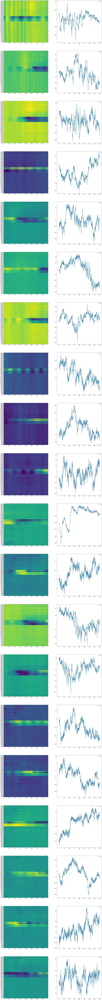

1 mn9686-21102021-0106
Duration of rest trials: [1212.516, 1212.408]
Reading /adata/projects/autopi_ca1/mn9686/mn9686-21102021-0106/mn9686-21102021_06.dat
(64, 24248159) 65
ref:20
broken channels:
[51 53 55 59 60 61 62 63]
Allocating for mean power zero array
Zeros allocated


100%|███████████████████████████████████████████| 56/56 [21:00<00:00, 22.50s/it]


Saving /adata/projects/autopi_ca1/mn9686/mn9686-21102021-0106/ripplePower.npy
power shape: (24248159,)
Saving /adata/projects/autopi_ca1/mn9686/mn9686-21102021-0106/ripplePeaks.npy
ripplePeaks shape: (61,)


100%|█████████████████████████████████████████| 64/64 [00:00<00:00, 1312.51it/s]


Saving /adata/projects/autopi_ca1/mn9686/mn9686-21102021-0106/ripplePowerRatios.npy
(61,)
Saving /adata/projects/autopi_ca1/mn9686/mn9686-21102021-0106/ripplePeaks.pdf


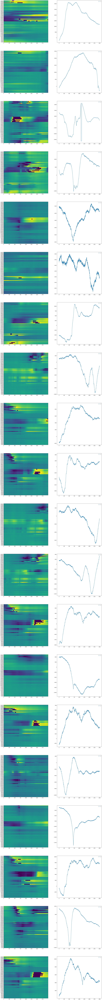

2 mn9686-26102021-0106
Duration of rest trials: [1212.696, 1212.444]
Reading /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/mn9686-26102021_06.dat
(64, 24248879) 65
ref:30
broken channels:
[51 53 55 59 60 61 62 63]
Allocating for mean power zero array
Zeros allocated


100%|███████████████████████████████████████████| 56/56 [20:56<00:00, 22.43s/it]


Saving /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/ripplePower.npy
power shape: (24248879,)
Saving /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/ripplePeaks.npy
ripplePeaks shape: (70,)


100%|█████████████████████████████████████████| 64/64 [00:00<00:00, 1340.05it/s]


Saving /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/ripplePowerRatios.npy
(70,)
Saving /adata/projects/autopi_ca1/mn9686/mn9686-26102021-0106/ripplePeaks.pdf


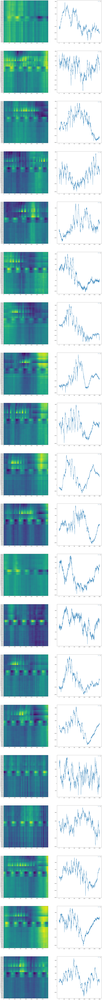

3 mn9686-27102021-0106
Duration of rest trials: [1621.08, 1212.624]
Reading /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/mn9686-27102021_06.dat
(64, 24252479) 65
ref:30
broken channels:
[51 53 55 59 60 61 62 63]
Allocating for mean power zero array
Zeros allocated


100%|███████████████████████████████████████████| 56/56 [20:43<00:00, 22.20s/it]


Saving /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/ripplePower.npy
power shape: (24252479,)
Saving /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/ripplePeaks.npy
ripplePeaks shape: (240,)


100%|██████████████████████████████████████████| 64/64 [00:00<00:00, 560.85it/s]


Saving /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/ripplePowerRatios.npy
(240,)
Saving /adata/projects/autopi_ca1/mn9686/mn9686-27102021-0106/ripplePeaks.pdf


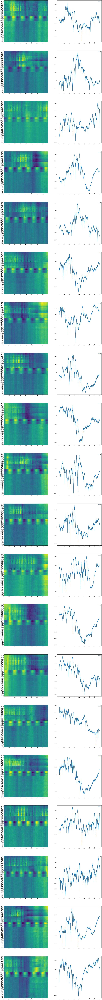

4 mn9686-28102021-0107
Duration of rest trials: [1212.516, 1212.588]
Reading /adata/projects/autopi_ca1/mn9686/mn9686-28102021-0107/mn9686-28102021_07.dat
(64, 24251759) 65
ref:30
broken channels:
[51 53 55 59 60 61 62 63]
Allocating for mean power zero array
Zeros allocated


 39%|████████████████▉                          | 22/56 [08:34<13:15, 23.40s/it]


KeyboardInterrupt: 

In [53]:
# session 7 looks great
for i,ses in enumerate(sSesListLocal[33:]):
    print(i,ses.name)
    detect_shanks_with_ripples(ses)